# Импорт библиотек и первоначальные настройки

In [1]:
!pip install segmentation-models==1.0

     |████████████████████████████████| 50 kB 1.3 MB/s eta 0:00:01
You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.


In [3]:
import os
import cv2
import keras
import random
import warnings
import numpy as np
import pandas as pd
import seaborn as sns
import albumentations as albu
import matplotlib.pyplot as plt
import zipfile

import tensorflow as tf
import datetime 
import time
import shutil

from sklearn.model_selection import train_test_split
from keras import optimizers
from keras import backend as K
from keras.models import Model
from keras.losses import binary_crossentropy
from keras.callbacks import EarlyStopping, ReduceLROnPlateau
seed = 0
random.seed(0)
os.environ['PYTHONHASHSEED'] = str(0)
np.random.seed(0)
tf.random.set_seed(0)

%matplotlib inline
warnings.filterwarnings("ignore")
import segmentation_models as sm
from tqdm import tqdm_notebook

Segmentation Models: using `keras` framework.


In [2]:
import shutil
shutil.copyfile("../input/-init/__init__.py", "/opt/conda/lib/python3.7/site-packages/efficientnet/__init__.py")

'/opt/conda/lib/python3.7/site-packages/efficientnet/__init__.py'

In [4]:
!mkdir ~/.kaggle
!touch ~/.kaggle/kaggle.json

api_token = {"username":"housemdrnd","key":"0123456789abcdef"}
import json
with open('/root/.kaggle/kaggle.json', 'w') as file:
    json.dump(api_token, file)

!chmod 600 ~/.kaggle/kaggle.json

# Вспомогательные функции

In [5]:
def np_resize(img, input_shape):
    height, width = input_shape
    return cv2.resize(img, (width, height))

In [6]:
def mask2rle(img):
    pixels= img.T.flatten()
    pixels = np.concatenate([[0], pixels, [0]])
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    runs[1::2] -= runs[::2]
    return ' '.join(str(x) for x in runs)

In [7]:
def rle2mask(rle, input_shape):
    width, height = input_shape[:2]
    mask = np.zeros(width * height).astype(np.uint8)
    array = np.asarray([int(x) for x in rle.split()])
    starts = array[0::2]
    lengths = array[1::2]
    current_position = 0
    for index, start in enumerate(starts):
        mask[int(start):int(start+lengths[index])] = 1
        current_position += lengths[index]
    return mask.reshape(height, width).T

In [8]:
def build_masks(rles, input_shape, reshape=None):
    depth = len(rles)
    if reshape is None:
        masks = np.zeros((*input_shape, depth))
    else:
        masks = np.zeros((*reshape, depth))
    
    for i, rle in enumerate(rles):
        if type(rle) is str:
            if reshape is None:
                masks[:, :, i] = rle2mask(rle, input_shape)
            else:
                mask = rle2mask(rle, input_shape)
                reshaped_mask = np_resize(mask, reshape)
                masks[:, :, i] = reshaped_mask
    return masks

In [9]:
def build_rles(masks, reshape=None):
    width, height, depth = masks.shape
    rles = []
    for i in range(depth):
        mask = masks[:, :, i]
        if reshape:
            mask = mask.astype(np.float32)
            mask = np_resize(mask, reshape).astype(np.int64)
        rle = mask2rle(mask)
        rles.append(rle) 
    return rles

In [10]:
def dice_coef(y_true, y_pred, smooth=1):
    tf.cast(y_true, tf.float32)
    tf.cast(y_pred, tf.float32)
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

In [11]:
def post_process(mask, min_size=11000):
    cnt_component, component = cv2.connectedComponents(mask.astype(np.uint8))
    predictions = np.zeros(mask.shape, np.float32)
    for c in range(1, cnt_component):
        p = (component == c)
        if p.sum() > min_size:
            predictions[p] = 1
    return predictions

# Загрузка данных

In [12]:
path = '../input/understanding_cloud_organization'
os.listdir(path)

['sample_submission.csv', 'train_images', 'train.csv', 'test_images']

In [13]:
train = pd.read_csv(f'{path}/train.csv')
submission = pd.read_csv(f'{path}/sample_submission.csv')
print('Number of train samples:', train.shape[0])
print('Number of test samples:', submission.shape[0])

train['image'] = train['Image_Label'].\
apply(lambda x: x.split('_')[0])
train['label'] = train['Image_Label'].\
apply(lambda x: x.split('_')[1])
submission['image'] = submission['Image_Label'].apply(lambda x: x.split('_')[0])
test = pd.DataFrame(submission['image'].unique(), columns=['image'])

display(train.head())

Number of train samples: 22184
Number of test samples: 14792


,Image_Label,EncodedPixels,image,label
0,0011165.jpg_Fish,264918 937 266318 937 267718 937 269118 937 27...,0011165.jpg,Fish
1,0011165.jpg_Flower,1355565 1002 1356965 1002 1358365 1002 1359765...,0011165.jpg,Flower
2,0011165.jpg_Gravel,NaN,0011165.jpg,Gravel
3,0011165.jpg_Sugar,NaN,0011165.jpg,Sugar
4,002be4f.jpg_Fish,233813 878 235213 878 236613 878 238010 881 23...,002be4f.jpg,Fish


# Визуализация масок

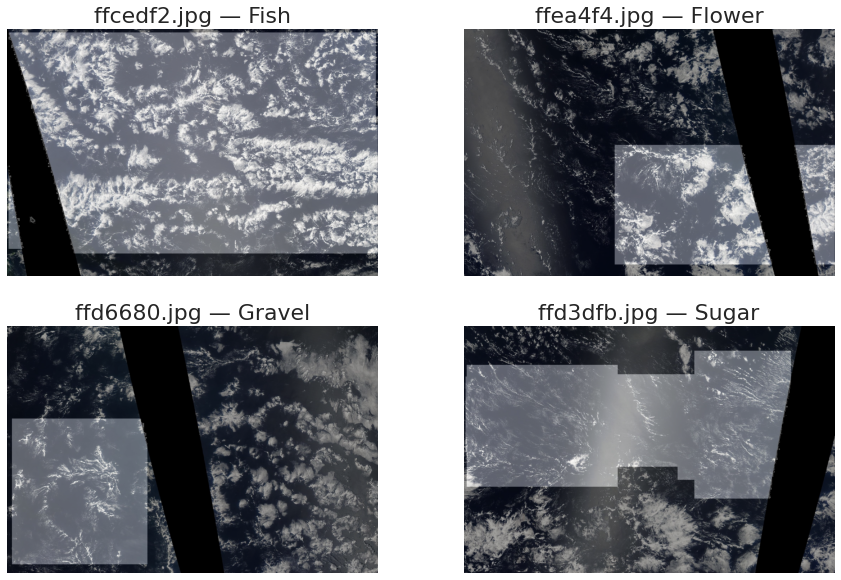

In [14]:
train['Has Mask'] = ~train['EncodedPixels'].isna()
maskedSamples = train[train['Has Mask'] == True]
lastLabel = maskedSamples.groupby('label').last().reset_index()

sns.set_style("white")
plt.figure(figsize=[15, 10])
for index, row in lastLabel.iterrows():
    img = cv2.imread(f"{path}/train_images/{row['image']}")[...,[2, 1, 0]]
    plt.subplot(2, 2, index+1)
    mask = rle2mask(row['EncodedPixels'], (1400, 2100))
    plt.imshow(img)
    plt.imshow(mask, alpha=0.35, cmap='gray')
    plt.title(f"{row['image']} — {row['label']}", fontsize=22)
    plt.axis('off')
plt.show()

# Разделяем данные на тренировочные (80 %) и валидационные (20 %)

In [15]:
df = train.groupby('image').agg(np.sum).reset_index()
df.sort_values('Has Mask', ascending=False, inplace=True)
train_idx, val_idx = train_test_split(df.index, test_size=0.2, random_state=seed)

# Генератор данных

In [16]:
BATCH_SIZE = 8
now = datetime.datetime.now()

In [17]:
class DataGenerator(keras.utils.Sequence):
    'Generates data for Keras'
    def __init__(self, list_IDs, df, target_df=None, mode='fit',
                 base_path=f'{path}/train_images',
                 batch_size=BATCH_SIZE, dim=(1400, 2100), n_channels=3, reshape=None, 
                 n_classes=4, random_state=seed, shuffle=True, augment=False):
        self.dim = dim
        self.batch_size = batch_size
        self.df = df
        self.mode = mode
        self.base_path = base_path
        self.target_df = target_df
        self.list_IDs = list_IDs
        self.reshape = reshape
        self.n_channels = n_channels
        self.n_classes = n_classes
        self.shuffle = shuffle
        self.augment = augment
        self.random_state = random_state
        
        self.on_epoch_end()

    def __len__(self):
        'Denotes the number of batches per epoch'
        return int(np.floor(len(self.list_IDs) / self.batch_size))

    def __getitem__(self, index):
        'Generate one batch of data'
        indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]
        list_IDs_batch = [self.list_IDs[k] for k in indexes]
        X = self.__generate_X(list_IDs_batch)
        
        if self.mode == 'fit':
            y = self.__generate_y(list_IDs_batch)
            
            if self.augment:
                X, y = self.__augment_batch(X, y)
            
            return X, y
        
        elif self.mode == 'predict':
            return X

        else:
            raise AttributeError('The mode parameter should be set to "fit" or "predict".')
        
    def on_epoch_end(self):
        'Updates indexes after each epoch'
        self.indexes = np.arange(len(self.list_IDs))
        if self.shuffle == True:
            np.random.seed(self.random_state)
            np.random.shuffle(self.indexes)
    
    def __generate_X(self, list_IDs_batch):
        'Generates data containing batch_size samples'
        if self.reshape is None:
            X = np.empty((self.batch_size, *self.dim, self.n_channels))
        else:
            X = np.empty((self.batch_size, *self.reshape, self.n_channels))
        
        for i, ID in enumerate(list_IDs_batch):
            im_name = self.df['image'].iloc[ID]
            img_path = f"{self.base_path}/{im_name}"
            img = cv2.imread(img_path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            img = img.astype(np.float32) / 255.
            
            if self.reshape is not None:
                img = np_resize(img, self.reshape)
            
            X[i,] = img
        return X
    
    def __generate_y(self, list_IDs_batch):
        if self.reshape is None:
            y = np.empty((self.batch_size, *self.dim, self.n_classes), dtype=int)
        else:
            y = np.empty((self.batch_size, *self.reshape, self.n_classes), dtype=int)
        
        for i, ID in enumerate(list_IDs_batch):
            im_name = self.df['image'].iloc[ID]
            image_df = self.target_df[self.target_df['image'] == im_name]
            
            rles = image_df['EncodedPixels'].values
            
            if self.reshape is not None:
                masks = build_masks(rles, input_shape=self.dim, reshape=self.reshape)
            else:
                masks = build_masks(rles, input_shape=self.dim)
            
            y[i, ] = masks

        return y
    
    def __augment_batch(self, img_batch, masks_batch):
        for i in range(img_batch.shape[0]):
            img_batch[i, ], masks_batch[i, ] = self.__random_transform(img_batch[i, ], masks_batch[i, ])
        
        return img_batch, masks_batch
    
    def __random_transform(self, img, masks):
        composition = albu.Compose([albu.HorizontalFlip(p=0.7),
                                    albu.VerticalFlip(p=0.7)])
        
        composed = composition(image=img, mask=masks)
        img_aug = composed['image']
        masks_aug = composed['mask']
        
        return img_aug, masks_aug

In [19]:
train_generator = DataGenerator(
                  train_idx, 
                  df=df,
                  target_df=train,
                  batch_size=BATCH_SIZE,
                  reshape=(320, 480),
                  n_channels=3,
                  n_classes=4,
                  augment=True,
                  random_state=seed)

valid_generator = DataGenerator(
                  val_idx, 
                  df=df,
                  target_df=train,
                  batch_size=BATCH_SIZE, 
                  reshape=(320, 480),
                  n_channels=3,
                  n_classes=4,
                  random_state=seed)

# Callback-функции и загрузка модели

In [20]:
erlstop = EarlyStopping(monitor='val_loss', mode='min', patience=5, restore_best_weights=True, verbose=1)
redlr = ReduceLROnPlateau(monitor='val_loss', mode='min', patience=3, factor=0.5, min_lr=1e-6, verbose=1)
callback_list = [erlstop, redlr]

def download_model(BACKBONE_NAME):
    sm.get_preprocessing(BACKBONE_NAME)
    model = sm.FPN(
            backbone_name=BACKBONE_NAME, 
            classes=4,
            activation='sigmoid',
            input_shape=(320, 480, 3))

    optimizer = optimizers.Adam(lr=3e-4)
    model.compile(optimizer=optimizer, loss=binary_crossentropy, metrics=[dice_coef])
    return model

# Функция обучения модели

In [21]:
def fit_model(EPOCH_COUNT, model):
    history = model.fit_generator(generator=train_generator,
                                validation_data=valid_generator,
                                epochs=EPOCH_COUNT,
                                callbacks=callback_list,
                                verbose=1).history
    return history

# Визуализация обучения — графики функции потерь и коэффициента Дайса

In [22]:
def plot(DESCRIPTION, history):
    print(DESCRIPTION)
    fig, (ax1, ax2) = plt.subplots(2, 1, sharex='col', figsize=(20, 12))

    ax1.plot(history['loss'], label='Функция потерь на обучающем множестве')
    ax1.plot(history['val_loss'], label='Функция потерь на валидационном множестве')
    ax1.legend(loc='best')
    ax1.set_title('Функция потерь')

    ax2.plot(history['dice_coef'], label='Коэффициент Дайса на обучающем множестве')
    ax2.plot(history['val_dice_coef'], label='Коэффициент Дайса на валидационном множестве')
    ax2.legend(loc='best')
    ax2.set_title('Коэффициент Дайса')
    plt.xlabel('Эпохи')
    sns.despine()
    plt.show()
    fig.savefig(DESCRIPTION + '.png', dpi=320)

# Предсказания (без постобработки / с постобработкой)

In [23]:
def predict(model):
    for i in range(0, test.shape[0], 500):
        print(f'{i/500 / len(range(0, test.shape[0], 500))*100} %', end='')
        batch_idx = list(range(i, min(test.shape[0], i + 500)))
        
        test_generator = DataGenerator(
                        batch_idx,
                        df=test,
                        target_df=submission,
                        batch_size=1,
                        reshape=(320, 480),
                        dim=(350, 525),
                        n_channels=3,
                        n_classes=4,
                        random_state=seed,
                        base_path=f'{path}/test_images',
                        mode='predict',
                        shuffle=False)
        
        batch_pred_masks = model.predict_generator(test_generator)
        
        for j, b in tqdm_notebook(enumerate(batch_idx), total=len(batch_idx)):
            #print(j, end='')
            filename = test['image'].iloc[b]
            image_df = submission[submission['image'] == filename].copy()
            pred_masks = batch_pred_masks[j, ].round().astype(int)
            
            ### Постобработка
            for t in [0.3, 0.4, 0.5, 0.6, 0.7]:
                pred_masks_post = batch_pred_masks[j, ].astype('float32') 
                for k in range(pred_masks_post.shape[-1]):
                    pred_mask = pred_masks_post[...,k]
                    mapmsk = pred_mask >= t
                    #print(pred_mask.shape)
                    #print(type(pred_mask))
                    pred_mask = np.where(mapmsk, 1, 0)
                    pred_mask = post_process(pred_mask.astype(int))
                    pred_masks_post[...,k] = pred_mask

                pred_rles_post = build_rles(pred_masks_post, reshape=(350, 525))
                image_df[f'EncodedPixels_post_{t}'] = pred_rles_post
            ###
            
            pred_rles = build_rles(pred_masks, reshape=(350, 525))        
            image_df['EncodedPixels'] = pred_rles
            test_df.append(image_df)

# Пример предсказаний

In [24]:
def ShowPredict(COL_NAME, DESCRIPTION):
    sns.set_style("white")
    plt.figure(figsize=[60, 20])
    for index, row in sub_df[8:16].iterrows():
        img = cv2.imread(f"{path}/test_images/{row['image']}")[...,[2, 1, 0]]
        img = cv2.resize(img, (525, 350))
        mask_rle = row[COL_NAME]
        try: 
            mask = rle2mask(mask_rle, img.shape)
        except:
            mask = np.zeros((1400, 2100))
        plt.subplot(2, 4, index+1-8)
        plt.imshow(img)
        plt.imshow(mask, alpha=0.35, cmap='gray')
        plt.title(f"Image {row['Image_Label']}", fontsize=22)
        plt.axis('off')    

    plt.savefig('clds' + DESCRIPTION, dpi = 320)
    plt.show()

# Сохранение решений (с постобработкой и без) в csv файлы

In [25]:
def SaveSubmission(DESCRIPTION):
    submission_df = sub_df[['Image_Label' ,'EncodedPixels']]
    submission_df.to_csv(f'submission{now.day}{now.month}-{DESCRIPTION}.csv', index=False)
    display(submission_df.head())

    for t in [0.3, 0.4, 0.5, 0.6, 0.7]:
        submission_df_post = sub_df[['Image_Label' ,f'EncodedPixels_post_{t}']]
        submission_df_post.columns = ['Image_Label' ,'EncodedPixels']
        submission_df_post.to_csv(f'post{t*10}-submission{now.day}{now.month}-{DESCRIPTION}.csv', index=False)
        display(submission_df_post.head())
    return (f'submission{now.day}{now.month}-{DESCRIPTION}.csv')

# Запуск процесса «обучение — предсказание — сохранение»

In [26]:
test_df = []
sub_df = []
model = []
def MakePredict(name, epoch_count):
    descr = f'backbone-{name}_epochcount-{epoch_count}_Блок1_FPN'
    global model
    model = download_model(name)
    history = fit_model(epoch_count, model)
    print("fit finished")
    plot(descr, history)
    predict(model)
    print("predict finished")
    global sub_df
    sub_df = pd.concat(test_df)
    ShowPredict('EncodedPixels', descr)
    for t in [0.3, 0.4, 0.5, 0.6, 0.7]:
        ShowPredict(f'EncodedPixels_post_{t}', 'post-' + descr)
    fname = SaveSubmission(descr)
    msg = f"backbone-{name} epochcount-{epoch_count} FPN БЛОК1"
    os.system(f"kaggle competitions submit -c understanding_cloud_organization -f {fname} -m \"{msg}\"")
    
    for t in [0.3, 0.4, 0.5, 0.6, 0.7]:
        msg = f"backbone-{name} epochcount-{epoch_count} FPN БЛОК1 with post t {t}"
        fname1 = f'post{t*10}-' + fname
        time.sleep(50)
        os.system(f"kaggle competitions submit -c understanding_cloud_organization -f {fname1} -m \"{msg}\"")

87916544/87910968 [==============================] - 4s 0us/step
Epoch 1/15
554/554 [==============================] - 717s 1s/step - loss: 0.3144 - dice_coef: 0.3743 - val_loss: 0.3219 - val_dice_coef: 0.4201
Epoch 2/15
554/554 [==============================] - 704s 1s/step - loss: 0.2877 - dice_coef: 0.4136 - val_loss: 0.3252 - val_dice_coef: 0.4427
Epoch 3/15
554/554 [==============================] - 701s 1s/step - loss: 0.2786 - dice_coef: 0.4338 - val_loss: 0.2942 - val_dice_coef: 0.4467
Epoch 4/15
554/554 [==============================] - 702s 1s/step - loss: 0.2724 - dice_coef: 0.4443 - val_loss: 0.2851 - val_dice_coef: 0.4713
Epoch 5/15
554/554 [==============================] - 724s 1s/step - loss: 0.2652 - dice_coef: 0.4594 - val_loss: 0.2786 - val_dice_coef: 0.4606
Epoch 6/15
554/554 [==============================] - 693s 1s/step - loss: 0.2583 - dice_coef: 0.4738 - val_loss: 0.3080 - val_dice_coef: 0.4439
Epoch 7/15
554/554 [==============================] - 694s 1s/ste

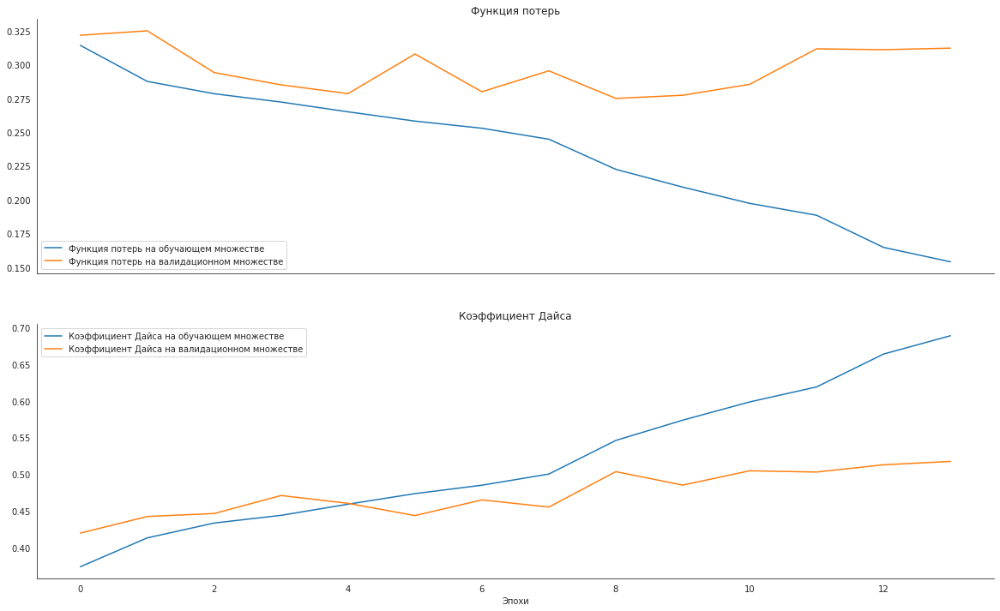

0.0 %


12.5 %


25.0 %


37.5 %


50.0 %


62.5 %


75.0 %


87.5 %


predict finished


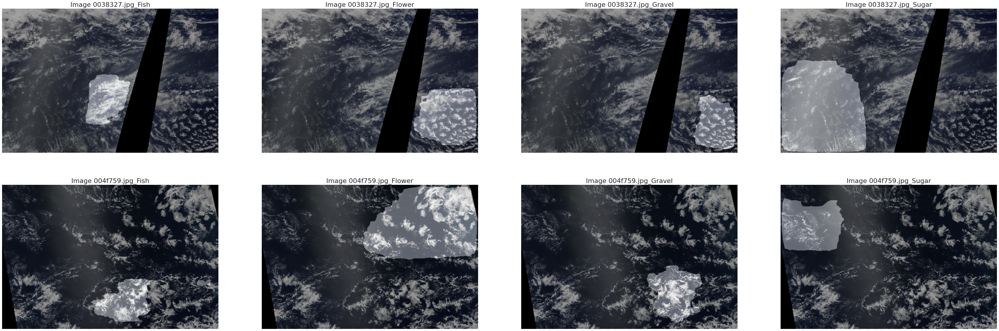

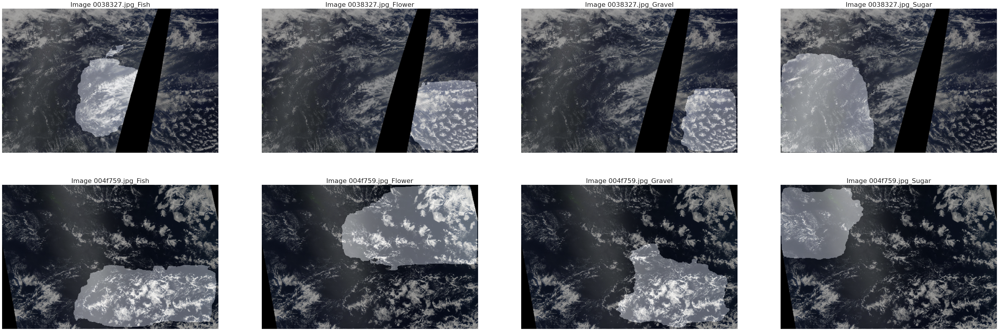

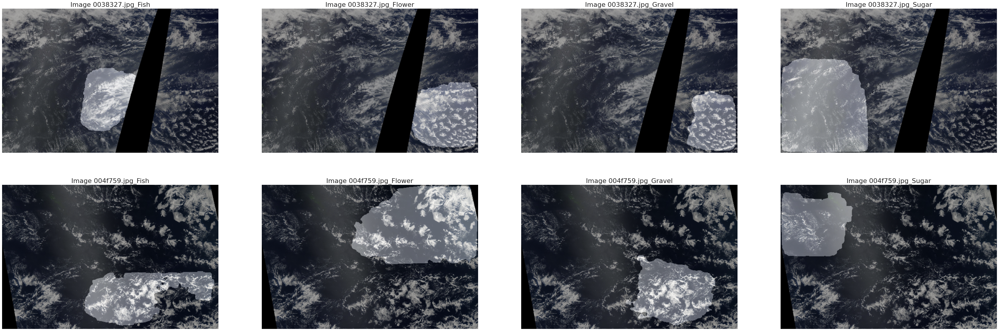

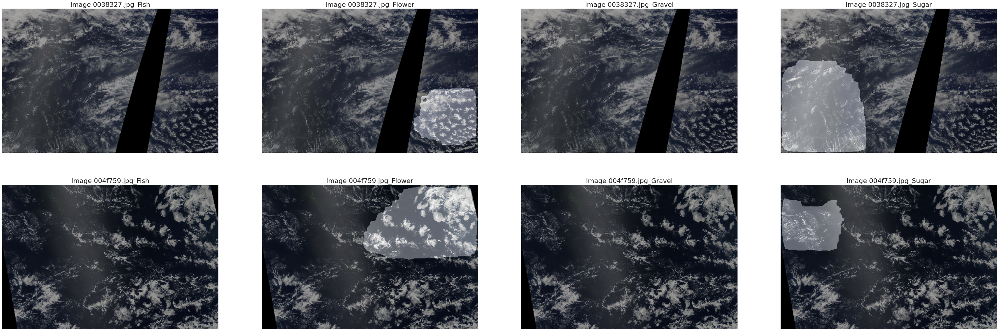

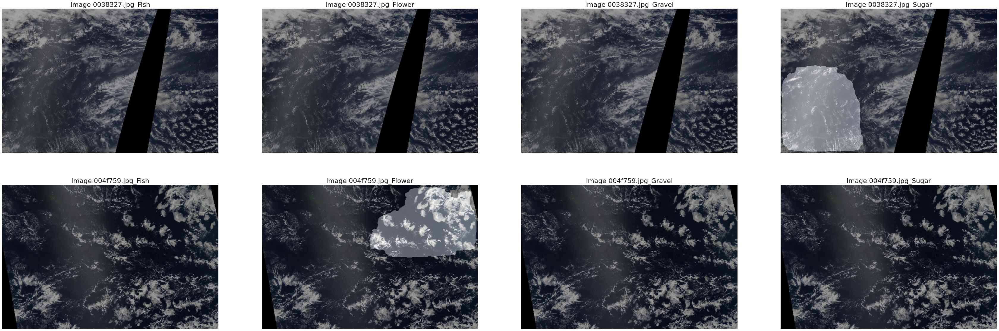

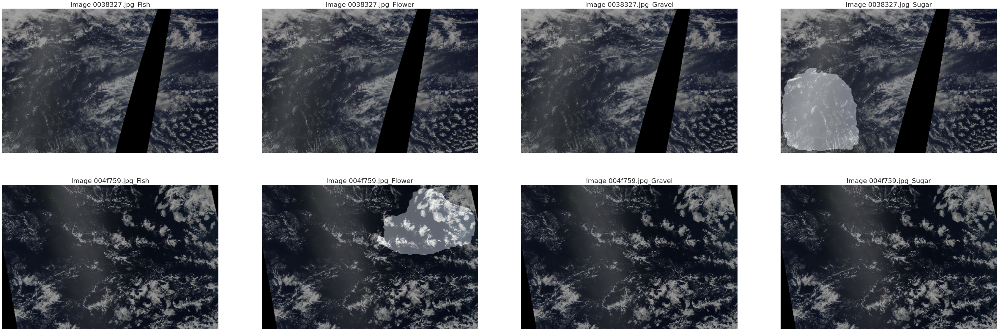

,Image_Label,EncodedPixels
0,002f507.jpg_Fish,
1,002f507.jpg_Flower,
2,002f507.jpg_Gravel,708 335 1055 341 1404 343 1754 344 2104 344 24...
3,002f507.jpg_Sugar,
4,0035ae9.jpg_Fish,


,Image_Label,EncodedPixels
0,002f507.jpg_Fish,
1,002f507.jpg_Flower,
2,002f507.jpg_Gravel,12 324 362 324 704 344 1053 345 1403 345 1753 ...
3,002f507.jpg_Sugar,123648 13 123996 17 124043 5 124068 2 124086 5...
4,0035ae9.jpg_Fish,


,Image_Label,EncodedPixels
0,002f507.jpg_Fish,
1,002f507.jpg_Flower,
2,002f507.jpg_Gravel,37 276 387 276 705 341 1054 344 1404 344 1753 ...
3,002f507.jpg_Sugar,
4,0035ae9.jpg_Fish,


,Image_Label,EncodedPixels
0,002f507.jpg_Fish,
1,002f507.jpg_Flower,
2,002f507.jpg_Gravel,708 335 1055 341 1404 343 1754 344 2104 344 24...
3,002f507.jpg_Sugar,
4,0035ae9.jpg_Fish,


,Image_Label,EncodedPixels
0,002f507.jpg_Fish,
1,002f507.jpg_Flower,
2,002f507.jpg_Gravel,715 320 1057 338 1406 340 1755 342 2105 342 24...
3,002f507.jpg_Sugar,
4,0035ae9.jpg_Fish,


,Image_Label,EncodedPixels
0,002f507.jpg_Fish,
1,002f507.jpg_Flower,
2,002f507.jpg_Gravel,734 285 1062 328 1408 336 1757 338 2107 339 24...
3,002f507.jpg_Sugar,
4,0035ae9.jpg_Fish,


In [29]:
test_df = []
sub_df = []
MakePredict('inceptionv3', 15)

In [ ]:
predict(model)